## ***Model Loading***

In [6]:
import os
import torch
from model.evaluation import evaluate_bleu
from model.generation import image_caption
from model.trainer import  vocab

from model.trainer import test_dataset
from model.model_config import model , device


# loading the checkpoint

if os.path.exists(f"test1_without gussian_noise and early layer classification loss with beta of .1 & confiance_loss with beta2 of 1e-3/checkpoint_9.pth"):
    checkpoint = torch.load(f"test1_without gussian_noise and early layer classification loss with beta of .1 & confiance_loss with beta2 of 1e-3/checkpoint_9.pth", map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])

print("\n the model loaded \n\n")




 the model loaded 




## ***Evaluation***

- Confidance (100%)

In [2]:
import time

print("*Evaluation*: \n")
# mean all layer
confidance = 1

torch.cuda.synchronize()
start_time = time.time()

bl1,bl4=evaluate_bleu(model, test_dataset, vocab, device="cuda", max_examples=None , confidance=confidance)

torch.cuda.synchronize()
end_time = time.time()

print("======= The Scores ========")

print(f'bl1:{bl1}')
print(f'bl4:{bl4}')

print(f"============ Evaluation time ===========")

print(f"Start time : {start_time} ------  End time : {end_time}")
print(f"The time been taked {(end_time - start_time)/60} Minutes  with confidance of {confidance}")


*Evaluation*: 

The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [1.410820484161377] 
The early layer  for the token : [man] is : the Layer [-1] and it's exit probability is [0.23958821594715118] 
The early layer  for the token : [and] is : the Layer [-1] and it's exit probability is [-0.21750973165035248] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [0.5134875774383545] 
The early layer  for the token : [woman] is : the Layer [-1] and it's exit probability is [0.24888359010219574] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [0.005117103457450867] 
The early layer  for the token : [sitting] is : the Layer [-1] and it's exit probability is [-0.37638992071151733] 
The early layer  for the token : [on] is : the Layer [-1] and it's exit probability is [-0.03203760087490082] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [0.32212

The early layer  for the token : [two] is : the Layer [-1] and it's exit probability is [1.1486977338790894] 
The early layer  for the token : [dogs] is : the Layer [-1] and it's exit probability is [0.6494626402854919] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [-0.5137694478034973] 
The early layer  for the token : [playing] is : the Layer [-1] and it's exit probability is [-1.1021796464920044] 
The early layer  for the token : [in] is : the Layer [-1] and it's exit probability is [0.054640039801597595] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [0.5901024341583252] 
The early layer  for the token : [field] is : the Layer [-1] and it's exit probability is [0.4331446886062622] 
The early layer  for the token : [of] is : the Layer [-1] and it's exit probability is [-0.9629104137420654] 
The early layer  for the token : [grass] is : the Layer [-1] and it's exit probability is [0.02157645672559738] 

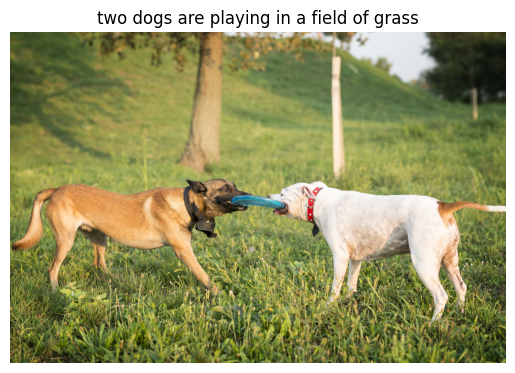

two dogs are playing in a field of grass


In [7]:
print(image_caption( model=model , full_image_path='test_images/two-dogs-playing-with-flying-disc-park.jpg' , vocab=vocab.W2i, max_length=40 , confidance = 1))


- Confidance (50%)

In [3]:
import time

print("*Evaluation*: \n")
# mean all layer
confidance = .5

torch.cuda.synchronize()
start_time = time.time()

bl1,bl4=evaluate_bleu(model, test_dataset, vocab, device="cuda", max_examples=None , confidance=confidance)

torch.cuda.synchronize()
end_time = time.time()

print("======= The Scores ========")

print(f'bl1:{bl1}')
print(f'bl4:{bl4}')

print(f"============ Evaluation time ===========")

print(f"Start time : {start_time} ------  End time : {end_time}")
print(f"The time been taked {(end_time - start_time)/60} Minutes  with confidance of {confidance}")

*Evaluation*: 

The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.6130528450012207] 
The early layer  for the token : [man] is : the Layer [-1] and it's exit probability is [0.23958821594715118] 
The early layer  for the token : [and] is : the Layer [-1] and it's exit probability is [-0.21750973165035248] 
The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.5537082552909851] 
The early layer  for the token : [woman] is : the Layer [1] and it's exit probability is [0.553589403629303] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [0.005117103457450867] 
The early layer  for the token : [sitting] is : the Layer [-1] and it's exit probability is [-0.37638992071151733] 
The early layer  for the token : [on] is : the Layer [-1] and it's exit probability is [-0.03203760087490082] 
The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.5886869430

The early layer  for the token : [two] is : the Layer [0] and it's exit probability is [0.6343974471092224] 
The early layer  for the token : [dogs] is : the Layer [0] and it's exit probability is [0.5740682482719421] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [-0.5137694478034973] 
The early layer  for the token : [playing] is : the Layer [-1] and it's exit probability is [-1.1021796464920044] 
The early layer  for the token : [in] is : the Layer [1] and it's exit probability is [0.5181708931922913] 
The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.623123049736023] 
The early layer  for the token : [field] is : the Layer [-1] and it's exit probability is [0.4331446886062622] 


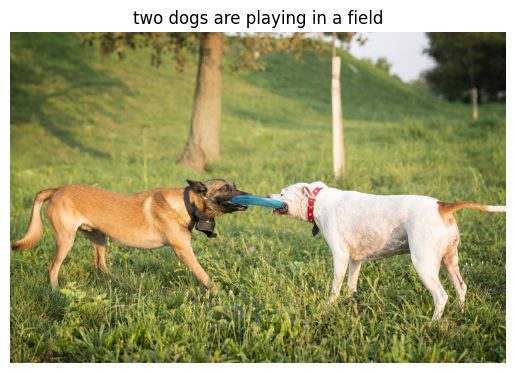

two dogs are playing in a field


In [9]:
print(image_caption( model=model , full_image_path='test_images/two-dogs-playing-with-flying-disc-park.jpg' , vocab=vocab.W2i, max_length=40 , confidance = .5))


In [5]:
print(f"The number of trained parameters {sum(p.numel() for p in model.parameters() if p.requires_grad)} ")


The number of trained parameters 138608849 


## With Noise as regulization

In [ ]:
import os
import torch
from model.evaluation import evaluate_bleu
from model.generation import image_caption
from model.trainer import  vocab

from model.trainer import test_dataset
from model.model_config import model , device


# loading the checkpoint

if os.path.exists(f"test2_with gussian_noise and noise_strength = .2 and early layer classification loss wiht beta of .1 & confiance_loss with beta2 of 1e-3/checkpoint_9.pth"):
    checkpoint = torch.load(f"test2_with gussian_noise and noise_strength = .2 and early layer classification loss wiht beta of .1 & confiance_loss with beta2 of 1e-3/checkpoint_9.pth", 
                            map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])

print("\n the model loaded \n\n")



Total unique images: 8091
Train images: 7079
Test images: 1012
Train samples: 35395
Test samples: 5060
Image overlap: 0
Vocabulary size: 3825

========== DATASET SUMMARY ==========
Train unique images : 7079
Test unique images  : 1012
Train samples       : 35395
Test samples        : 5060
Vocabulary size     : 3825
Image overlap       : 0

================= Trainer ===============

 the model loaded 




## Evaluation
- in this evaluation the model has trained using guassian noise and ***noise strength of (.2)*** as regulization step

#### Confidance of (100%)

In [2]:
import time

print("*Evaluation*: \n")
# mean all layer
confidance = 1

torch.cuda.synchronize()
start_time = time.time()

bl1,bl4=evaluate_bleu(model, test_dataset, vocab, device="cuda", max_examples=None , confidance=confidance)

torch.cuda.synchronize()
end_time = time.time()

print("======= The Scores ========")

print(f'bl1:{bl1}')
print(f'bl4:{bl4}')

print(f"============ Evaluation time ===========")

print(f"Start time : {start_time} ------  End time : {end_time}")
print(f"The time been taked {(end_time - start_time)/60} Minutes  with confidance of {confidance}")


*Evaluation*: 

The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [1.5469334125518799] 
The early layer  for the token : [couple] is : the Layer [-1] and it's exit probability is [0.35332345962524414] 
The early layer  for the token : [of] is : the Layer [-1] and it's exit probability is [-0.2038138210773468] 
The early layer  for the token : [people] is : the Layer [-1] and it's exit probability is [0.756019115447998] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [0.2594384551048279] 
The early layer  for the token : [sitting] is : the Layer [-1] and it's exit probability is [-0.30149751901626587] 
The early layer  for the token : [on] is : the Layer [-1] and it's exit probability is [-0.07874707877635956] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [0.1256892830133438] 
The early layer  for the token : [bench] is : the Layer [-1] and it's exit probability is [0.60

The early layer  for the token : [two] is : the Layer [-1] and it's exit probability is [1.2794543504714966] 
The early layer  for the token : [dogs] is : the Layer [-1] and it's exit probability is [0.5695057511329651] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [-0.5818893313407898] 
The early layer  for the token : [playing] is : the Layer [-1] and it's exit probability is [-1.3780666589736938] 
The early layer  for the token : [in] is : the Layer [-1] and it's exit probability is [-0.47010260820388794] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [0.8531661033630371] 
The early layer  for the token : [field] is : the Layer [-1] and it's exit probability is [0.6603903770446777] 


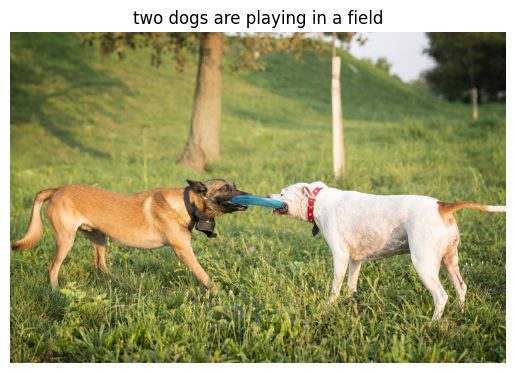

two dogs are playing in a field


In [9]:
print(image_caption( model=model , full_image_path='test_images/two-dogs-playing-with-flying-disc-park.jpg' , vocab=vocab.W2i, max_length=40 , confidance = 1))


#### Confidance of (50%)

In [4]:
import time

print("*Evaluation*: \n")
# mean all layer
confidance = .5

torch.cuda.synchronize()
start_time = time.time()

bl1,bl4=evaluate_bleu(model, test_dataset, vocab, device="cuda", max_examples=None , confidance=confidance)

torch.cuda.synchronize()
end_time = time.time()

print("======= The Scores ========")

print(f'bl1:{bl1}')
print(f'bl4:{bl4}')

print(f"============ Evaluation time ===========")

print(f"Start time : {start_time} ------  End time : {end_time}")
print(f"The time been taked {(end_time - start_time)/60} Minutes  with confidance of {confidance}")


*Evaluation*: 

The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.6007668375968933] 
The early layer  for the token : [couple] is : the Layer [-1] and it's exit probability is [0.35332345962524414] 
The early layer  for the token : [of] is : the Layer [-1] and it's exit probability is [-0.2038138210773468] 
The early layer  for the token : [people] is : the Layer [0] and it's exit probability is [0.5746805667877197] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [0.2594384551048279] 
The early layer  for the token : [sitting] is : the Layer [-1] and it's exit probability is [-0.30149751901626587] 
The early layer  for the token : [on] is : the Layer [-1] and it's exit probability is [-0.07874707877635956] 
The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.5230534672737122] 
The early layer  for the token : [bench] is : the Layer [-1] and it's exit probability is [0.6078

The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.6581627130508423] 
The early layer  for the token : [white] is : the Layer [-1] and it's exit probability is [0.4930814504623413] 
The early layer  for the token : [dog] is : the Layer [0] and it's exit probability is [0.7086225152015686] 
The early layer  for the token : [and] is : the Layer [-1] and it's exit probability is [-0.34212255477905273] 
The early layer  for the token : [a] is : the Layer [1] and it's exit probability is [0.6165512204170227] 
The early layer  for the token : [brown] is : the Layer [2] and it's exit probability is [0.5184242725372314] 
The early layer  for the token : [dog] is : the Layer [0] and it's exit probability is [0.6369934678077698] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [-0.8959189653396606] 
The early layer  for the token : [playing] is : the Layer [-1] and it's exit probability is [-1.3784592151641846] 
The ear

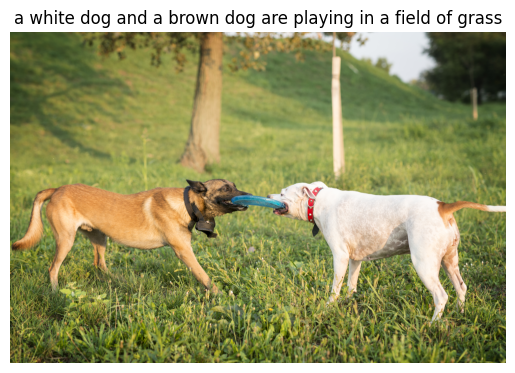

a white dog and a brown dog are playing in a field of grass


In [10]:
print(image_caption( model=model , full_image_path='test_images/two-dogs-playing-with-flying-disc-park.jpg' , vocab=vocab.W2i, max_length=40 , confidance = .5))


In [6]:
print(f"The number of trained parameters {sum(p.numel() for p in model.parameters() if p.requires_grad)} ")


The number of trained parameters 138608849 


In [1]:
import os
import torch
from model.evaluation import evaluate_bleu
from model.generation import image_caption
from model.trainer import  vocab

from model.trainer import test_dataset
from model.model_config import model , device


# loading the checkpoint

if os.path.exists(f"checkpoints/checkpoint_9.pth"):
    checkpoint = torch.load(f"checkpoints/checkpoint_9.pth", 
                            map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])

print("\n the model loaded \n\n")



Total unique images: 8091
Train images: 7079
Test images: 1012
Train samples: 35395
Test samples: 5060
Image overlap: 0
Vocabulary size: 3825

========== DATASET SUMMARY ==========
Train unique images : 7079
Test unique images  : 1012
Train samples       : 35395
Test samples        : 5060
Vocabulary size     : 3825
Image overlap       : 0

================= Trainer ===============

 the model loaded 




## Evaluation
- in this evaluation the model has trained using guassian noise and ***noise strength of (.35)*** as regulization step

#### Confidance of (100%)

In [2]:
import time

print("*Evaluation*: \n")
# mean all layer
confidance = 1

torch.cuda.synchronize()
start_time = time.time()

bl1,bl4=evaluate_bleu(model, test_dataset, vocab, device="cuda", max_examples=None , confidance=confidance)

torch.cuda.synchronize()
end_time = time.time()

print("======= The Scores ========")

print(f'bl1:{bl1}')
print(f'bl4:{bl4}')

print(f"============ Evaluation time ===========")

print(f"Start time : {start_time} ------  End time : {end_time}")
print(f"The time been taked {(end_time - start_time)/60} Minutes  with confidance of {confidance}")


*Evaluation*: 

The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [1.274629831314087] 
The early layer  for the token : [couple] is : the Layer [-1] and it's exit probability is [0.1233115941286087] 
The early layer  for the token : [of] is : the Layer [-1] and it's exit probability is [-0.07541044801473618] 
The early layer  for the token : [people] is : the Layer [-1] and it's exit probability is [0.683903694152832] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [0.2496974617242813] 
The early layer  for the token : [sitting] is : the Layer [-1] and it's exit probability is [-0.6720604300498962] 
The early layer  for the token : [on] is : the Layer [-1] and it's exit probability is [0.01702447235584259] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [-0.26596951484680176] 
The early layer  for the token : [bench] is : the Layer [-1] and it's exit probability is [0.345

The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [1.206099510192871] 
The early layer  for the token : [white] is : the Layer [-1] and it's exit probability is [0.4640468955039978] 
The early layer  for the token : [dog] is : the Layer [-1] and it's exit probability is [0.894493579864502] 
The early layer  for the token : [and] is : the Layer [-1] and it's exit probability is [-0.2699732184410095] 
The early layer  for the token : [a] is : the Layer [-1] and it's exit probability is [-0.12463200092315674] 
The early layer  for the token : [brown] is : the Layer [-1] and it's exit probability is [0.15741966664791107] 
The early layer  for the token : [dog] is : the Layer [-1] and it's exit probability is [0.9497052431106567] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [-0.7802484631538391] 
The early layer  for the token : [playing] is : the Layer [-1] and it's exit probability is [-1.0636043548583984] 
Th

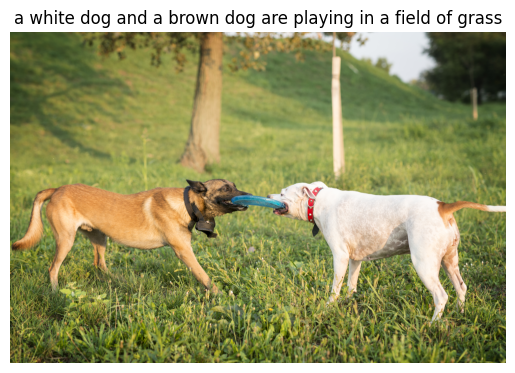

a white dog and a brown dog are playing in a field of grass


In [5]:
print(image_caption( model=model , full_image_path='test_images/two-dogs-playing-with-flying-disc-park.jpg' , vocab=vocab.W2i, max_length=40 , confidance = 1))


#### Confidance of (50%)

In [3]:
import time

print("*Evaluation*: \n")
# mean all layer
confidance = .5

torch.cuda.synchronize()
start_time = time.time()

bl1,bl4=evaluate_bleu(model, test_dataset, vocab, device="cuda", max_examples=None , confidance=confidance)

torch.cuda.synchronize()
end_time = time.time()

print("======= The Scores ========")

print(f'bl1:{bl1}')
print(f'bl4:{bl4}')

print(f"============ Evaluation time ===========")

print(f"Start time : {start_time} ------  End time : {end_time}")
print(f"The time been taked {(end_time - start_time)/60} Minutes  with confidance of {confidance}")


*Evaluation*: 

The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.6682801246643066] 
The early layer  for the token : [couple] is : the Layer [-1] and it's exit probability is [0.1233115941286087] 
The early layer  for the token : [of] is : the Layer [-1] and it's exit probability is [-0.07541044801473618] 
The early layer  for the token : [people] is : the Layer [0] and it's exit probability is [0.5509631633758545] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [0.2496974617242813] 
The early layer  for the token : [sitting] is : the Layer [-1] and it's exit probability is [-0.6720604300498962] 
The early layer  for the token : [on] is : the Layer [-1] and it's exit probability is [0.01702447235584259] 
The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.509549617767334] 
The early layer  for the token : [bench] is : the Layer [-1] and it's exit probability is [0.3452700

The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.6892540454864502] 
The early layer  for the token : [dog] is : the Layer [0] and it's exit probability is [0.5195126533508301] 
The early layer  for the token : [and] is : the Layer [-1] and it's exit probability is [-0.5201379060745239] 
The early layer  for the token : [a] is : the Layer [0] and it's exit probability is [0.5275390148162842] 
The early layer  for the token : [smaller] is : the Layer [1] and it's exit probability is [0.5255011320114136] 
The early layer  for the token : [dog] is : the Layer [0] and it's exit probability is [0.7076832056045532] 
The early layer  for the token : [are] is : the Layer [-1] and it's exit probability is [-0.5925142168998718] 
The early layer  for the token : [running] is : the Layer [-1] and it's exit probability is [-1.3111964464187622] 
The early layer  for the token : [in] is : the Layer [-1] and it's exit probability is [0.43375980854034424] 
The earl

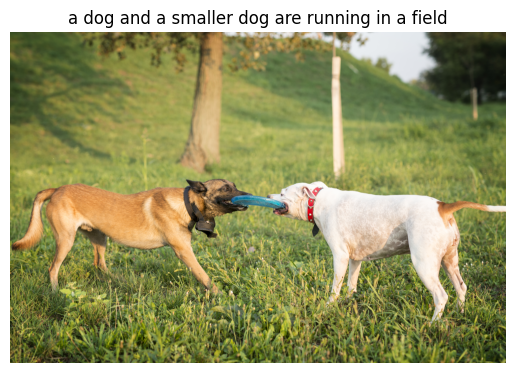

a dog and a smaller dog are running in a field


In [4]:
print(image_caption( model=model , full_image_path='test_images/two-dogs-playing-with-flying-disc-park.jpg' , vocab=vocab.W2i, max_length=40 , confidance = .5))
